In [1]:
# import&configure modules
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (10,10)
mpl.rcParams['axes.grid'] = False

import numpy as np
from PIL import Image
import time
import functools
import IPython.display

from PIL import Image
import urllib
import io

%tensorflow_version 1.x
import tensorflow as tf

from tensorflow.python.keras.preprocessing import image as kp_image
from tensorflow.python.keras import models 
from tensorflow.python.keras import losses
from tensorflow.python.keras import layers
from tensorflow.python.keras import backend as K

# enable eager execution
tf.enable_eager_execution()
print("Eager execution: {}".format(tf.executing_eagerly()))

TensorFlow 1.x selected.
Eager execution: True


In [2]:
# global values
g_img_url_list = ['https://raw.githubusercontent.com/pyuan-21/images/main/cat_duo_1.jpg', 
                  'https://raw.githubusercontent.com/pyuan-21/images/main/Visiting-the-Arc-de-Triomphe-in-Paris-by-Paris-Perfect1.jpg',
                  'https://raw.githubusercontent.com/pyuan-21/images/main/mona%20lisa.jpg',
                  'https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg', 
                  'https://upload.wikimedia.org/wikipedia/commons/b/b4/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg',
                  'https://upload.wikimedia.org/wikipedia/commons/4/46/Vincent_Willem_van_Gogh_127.jpg']

g_content_url = g_img_url_list[0]
g_style_url = g_img_url_list[4]

# VGG networks are trained on image with each channel normalized by mean = [103.939, 116.779, 123.68]and with channels BGR.
g_vgg_means = np.array([103.939, 116.779, 123.68]) # BGR order

# Content layer
# We refer to the feature responses in higher layers of the network as the content representation.
# higer layers such as "conv1_1", "conv2_1", "conv3_1" to construct content representation
g_content_layers = ['block5_conv1']

# Style layer, regarding what author said in ther paper, the performance of matching
# to style increases when style_layers increases from block1_conv1 to block5_conv1
g_style_layers = ['block1_conv1',
                  'block2_conv1',
                  'block3_conv1',
                  'block4_conv1',
                  'block5_conv1']

g_num_content_layers = len(g_content_layers)
g_num_style_layers = len(g_style_layers)

In [3]:
# All definition of functions below

# load img from URL
def load_img(img_url):
  max_dim = 512
  fd = urllib.request.urlopen(img_url)
  image_file = io.BytesIO(fd.read())
  img = Image.open(image_file)
  long = max(img.size)
  scale = max_dim/long
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)
  
  img = kp_image.img_to_array(img)
  
  # broadcast the image array for a batch dimension 
  img = np.expand_dims(img, axis=0)
  return img

def imshow(img, title=None):
  # Remove the batch dimension
  out = np.squeeze(img, axis=0)
  # Normalize for display 
  out = out.astype('uint8')
  plt.imshow(out)
  if title is not None:
    plt.title(title)
  plt.imshow(out)

def load_and_process_img(img_url):
  img = load_img(img_url)
  img = tf.keras.applications.vgg19.preprocess_input(img)
  return img

def deprocess_img(processed_img):
  x = processed_img.copy()
  if len(x.shape) == 4:
    x = np.squeeze(x, 0) # remove the first dimension
  assert len(x.shape) == 3, ("Input to deprocess image must be an image of "
                             "dimension [1, height, width, channel] or [height, width, channel]")
  if len(x.shape) != 3:
    raise ValueError("Invalid input to deprocessing image")
  
  # perform the inverse of the preprocessing step
  x[:, :, 0] += g_vgg_means[0]
  x[:, :, 1] += g_vgg_means[1]
  x[:, :, 2] += g_vgg_means[2]
  x = x[:, :, ::-1]

  x = np.clip(x, 0, 255).astype('uint8')
  return x

def get_model():
  # refer: "Extract and reuse nodes in the graph of layers" in https://keras.io/guides/functional_api/  
  # load pretrained VGG, trained on imagenet data
  vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False # no need to train, what I want to train is the mixed image I want, not the network
  # Get output layers corresponding to style and content layers 
  content_outputs = [vgg.get_layer(name).output for name in g_content_layers]
  style_outputs = [vgg.get_layer(name).output for name in g_style_layers]
  model_outputs = style_outputs + content_outputs
  # Build model, return the outputs from these intermediate layers from the VGG model.
  return models.Model(vgg.input, model_outputs)

# find content, style representation through layers(by using the model, Functional API)
def get_representation(model, content_url, style_url):
  content_image = load_and_process_img(content_url)
  style_image = load_and_process_img(style_url)
  style_outputs = model(style_image)
  content_outputs = model(content_image)

  # content_layer is a 4 dimension such as (1, 512, 384, 64), pick the first dimension element(which is 3 dimension), get the (512, 384, 64)
  style_representation = [style_layer[0] for style_layer in style_outputs[:g_num_style_layers]]
  content_representation = [content_layer[0] for content_layer in content_outputs[g_num_style_layers:]]
  return content_representation, style_representation

# define content loss function
def get_content_loss(generated_content, original_content):
  # from paper, L_content = sum(F-P)/2
  return tf.divide(tf.reduce_sum(tf.square(generated_content - original_content)), 2.0)

# define style loss function
def get_gram_matrix(input_tensor):
  # G = X^T * X
  # make input_tensor into M*N, N is channel, M is width*height
  # dimension is (width?, height?, channel)
  channels = int(input_tensor.shape[-1])
  a = tf.reshape(input_tensor, [-1, channels])
  M = tf.shape(a)[0]
  gram = tf.matmul(a, a, transpose_a=True) # gram is N*N matrix
  # from paper, E = sum(square(G-A)) / square(2NM)
  # put 1/2NM inside G and A
  return gram / tf.cast(2*M, tf.float32)
  
def get_style_loss(generated_style_gram, original_style_gram):
  # assume generated_style is G/2M, original_style is A/2M
  # mean(square(G/2M - A/2M))
  # gram is N*N, reduce_mean is divided by N*N
  return tf.reduce_mean(tf.square(generated_style_gram - original_style_gram))

def compute_loss(model, weight_ratio, generated_img, original_content_representation, original_style_representation_gram):
  model_outputs = model(generated_img)
  # get desirable image representation in content and style aspect.
  content_representation = [content_layer[0] for content_layer in model_outputs[g_num_style_layers:]]
  style_representation = [style_layer[0] for style_layer in model_outputs[:g_num_style_layers]]

  # calculate total_content_loss
  total_content_loss = 0
  for generated_content, original_content in zip(content_representation, original_content_representation):
    total_content_loss += get_content_loss(generated_content, original_content) # accumulate each layer's content loss
  
  # calculate total_style_loss
  # in paper, wl = [1/5, 1/5, 1/5, 1/5, 1/5] -> len is 5,
  total_style_loss = 0
  weight_per_layer = 1.0 / float(g_num_style_layers) # 1/5
  for generated_style, original_style_gram in zip(style_representation, original_style_representation_gram):
    generated_style_gram = get_gram_matrix(generated_style)
    total_style_loss += weight_per_layer * get_style_loss(generated_style_gram, original_style_gram) # accumulate each layer's content loss
  
  # calculate total loss
  # it seems the ratio(content_weight/style_weight) is 1e-3 or 1e-4 while showing the perfect result. (from the paper.)
  # set style_weight = 1
  style_weight = 1
  content_weight = style_weight * weight_ratio
  total_loss = content_weight * total_content_loss + style_weight * total_style_loss

  return total_loss, total_content_loss, total_style_loss

# gradient, refer: https://www.tensorflow.org/guide/autodiff
def compute_grads(cfg):
  loss_index = cfg['loss_index']
  cfg.pop('loss_index') # just avoid passing the loss_index into compute_loss()
  with tf.GradientTape() as tape: 
    all_loss = compute_loss(**cfg)
  # Compute gradients wrt input image
  loss = all_loss[loss_index]
  cfg['loss_index'] = loss_index
  return tape.gradient(loss, cfg['generated_img']), all_loss

In [15]:
# Put all method together to build Neural Style Transfer Method
def NeuralStyleTransfer(content_url, style_url, weight_ratio=1e-4, iteration_num=1000, loss_index=0, display=True, early_exit_cfg=None):
  # trainable to false. Train the generated image not the network
  model = get_model() 
  for layer in model.layers:
    layer.trainable = False

  # set generated image initial value
  generated_img = load_and_process_img(content_url)
  generated_img = tf.Variable(generated_img, dtype=tf.float32)

  # get representations
  content_representation, style_representation = get_representation(model, g_content_url, g_style_url)

  style_representation_gram = [get_gram_matrix(representation) for representation in style_representation]

  # init config_dict
  config_dict = {
      "model": model,
      "weight_ratio": weight_ratio, # content_weight/style_weight
      "generated_img": generated_img,
      "original_content_representation": content_representation,
      "original_style_representation_gram": style_representation_gram,
      "loss_index": loss_index, # for visualize content and style representation
  }

  # From TensorFlow documentation, "The default value of 1e-8 for epsilon might not be a good default in general. 
  # For example, when training an Inception network on ImageNet a current good choice is 1.0 or 0.1."
  opt = tf.train.AdamOptimizer(learning_rate=5, beta1=0.99, epsilon=1e-1)

  min_vals = -g_vgg_means
  max_vals = 255 - g_vgg_means 
  
  least_loss, best_matched_img = float('inf'), None

  # ---------------------------
  # For displaying
  # num_rows = 2
  # num_cols = 5
  # display_interval = iteration_num/(num_rows*num_cols)
  # start_time = time.time()
  global_start = time.time()
  # imgs = []
  # ---------------------------

  # --------early exit---------
  actual_iteration_num = 0
  last_loss = None
  loss_unchange_num = 0
  early_exit = early_exit_cfg is not None
  early_exit_num = early_exit_cfg.get('early_exit_num', None) if early_exit else None
  # ---------------------------

  for i in range(iteration_num):
    actual_iteration_num += 1
    grads, all_loss = compute_grads(config_dict)
    # total_loss, total_content_loss, total_style_loss = all_loss
    loss = all_loss[loss_index] # loss_index is 0, 1, 2 -> use 1 or 2 to show content or style representation
    opt.apply_gradients([(grads, generated_img)])
    clipped = tf.clip_by_value(generated_img, min_vals, max_vals)
    generated_img.assign(clipped)
    # find minimun of loss function
    if least_loss > loss:
      least_loss = loss
      best_matched_img = deprocess_img(generated_img.numpy())
    elif early_exit:
      if loss == last_loss:
        loss_unchange_num += 1
      else:
        loss_unchange_num = 0
      last_loss = loss
      if loss_unchange_num >= early_exit_num and best_matched_img is not None:
        print('actual_iteration_num: {}'.format(i))
        break

  # ---------------------------
    # if display and (i % display_interval== 0):
    #   start_time = time.time()
      
    #   # Use the .numpy() method to get the concrete numpy array
    #   plot_img = generated_img.numpy()
    #   plot_img = deprocess_img(plot_img)
    #   imgs.append(plot_img)
    #   IPython.display.clear_output(wait=True)
    #   IPython.display.display_png(Image.fromarray(plot_img))
    #   print('Iteration: {}'.format(i))        
    #   print('Total loss: {:.4e}, ' 
    #         'style loss: {:.4e}, '
    #         'content loss: {:.4e}, '
    #         'time: {:.4f}s'.format(total_loss, total_content_loss, total_style_loss, time.time() - start_time))
  print('Total time: {:.4f}s'.format(time.time() - global_start))
  # if display:
  #   IPython.display.clear_output(wait=True)
  #   plt.figure(figsize=(14,4))
  #   for i,img in enumerate(imgs):
  #       plt.subplot(num_rows,num_cols,i+1)
  #       plt.imshow(img)
  #       plt.xticks([])
  #       plt.yticks([])
  # ---------------------------
     
  return best_matched_img, least_loss

In [6]:
def show_results(content_url, style_url, best_matched_img=None):
  plt.figure(figsize=(20, 10))
  content = load_img(content_url) 
  style = load_img(style_url)

  plt.subplot(1, 2, 1)
  imshow(content, 'Content Image')

  plt.subplot(1, 2, 2)
  imshow(style, 'Style Image')

  if best_matched_img is not None: 
    plt.figure(figsize=(20, 20))

    plt.imshow(best_matched_img)
    plt.title('Output Image')
    plt.show()

In [ ]:
# show content and style image together.
# plt.figure(figsize=(15,15))
# content = load_img(g_content_url).astype('uint8')
# style = load_img(g_style_url).astype('uint8')
# plt.subplot(1, 2, 1)
# imshow(content, 'Content Image')
# plt.subplot(1, 2, 2)
# imshow(style, 'Style Image')
# plt.show()

# represented_content_img, _ = NeuralStyleTransfer(g_content_url, g_style_url, display=False, loss_index=1)
# represented_style_img, _ = NeuralStyleTransfer(g_content_url, g_style_url, display=False, loss_index=2)

Total time: 9791.1529s


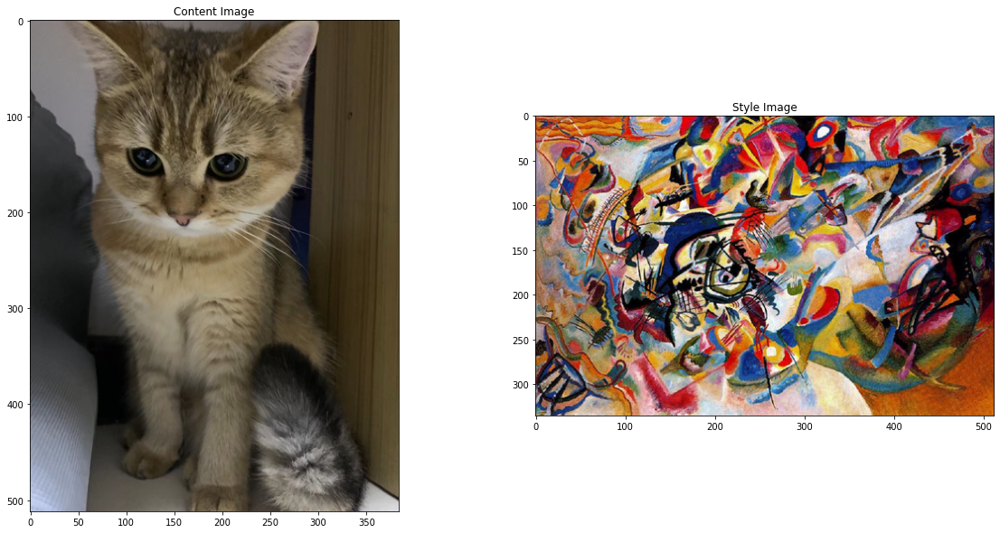

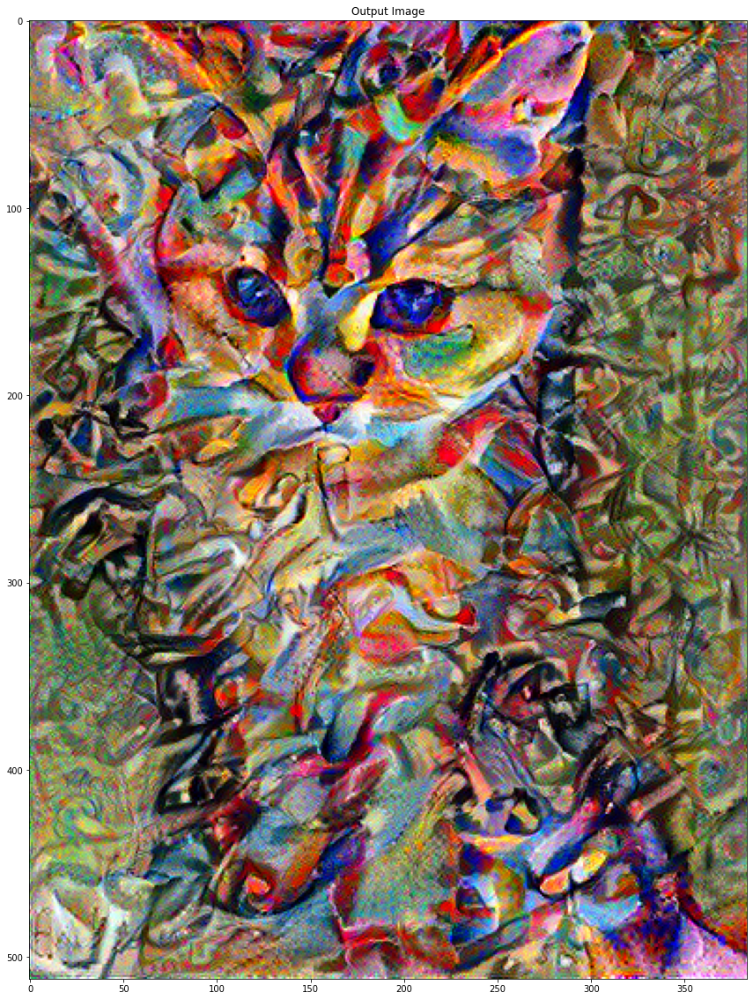

In [ ]:
# output display

# Image.fromarray(represented_content_img)
# Image.fromarray(represented_style_img)

# show Cat with Style from Vassily_Kandinsky
best_matched_img, least_loss = NeuralStyleTransfer(g_content_url, g_style_url, weight_ratio=1e-4, display=False)
show_results(g_content_url, g_style_url, best_matched_img)

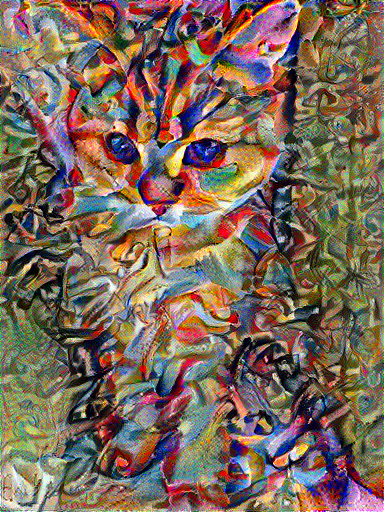

In [ ]:
# show Cat with Style from Vassily_Kandinsky
Image.fromarray(best_matched_img)

80142336/80134624 [==============================] - 1s 0us/step
Total time: 7839.4308s


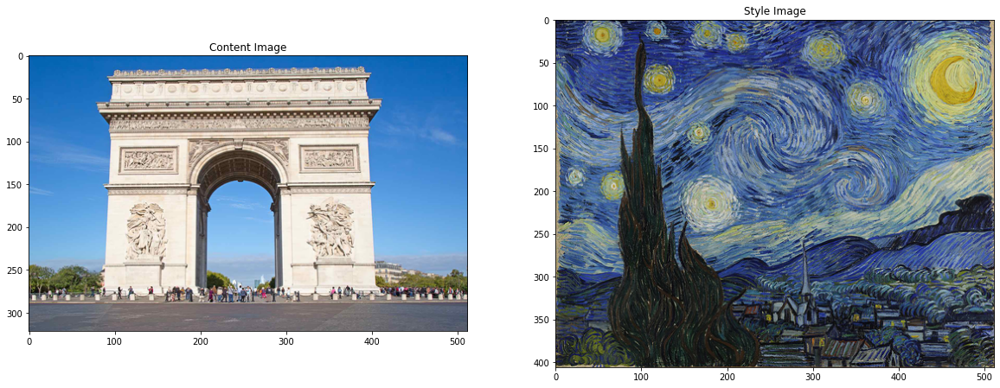

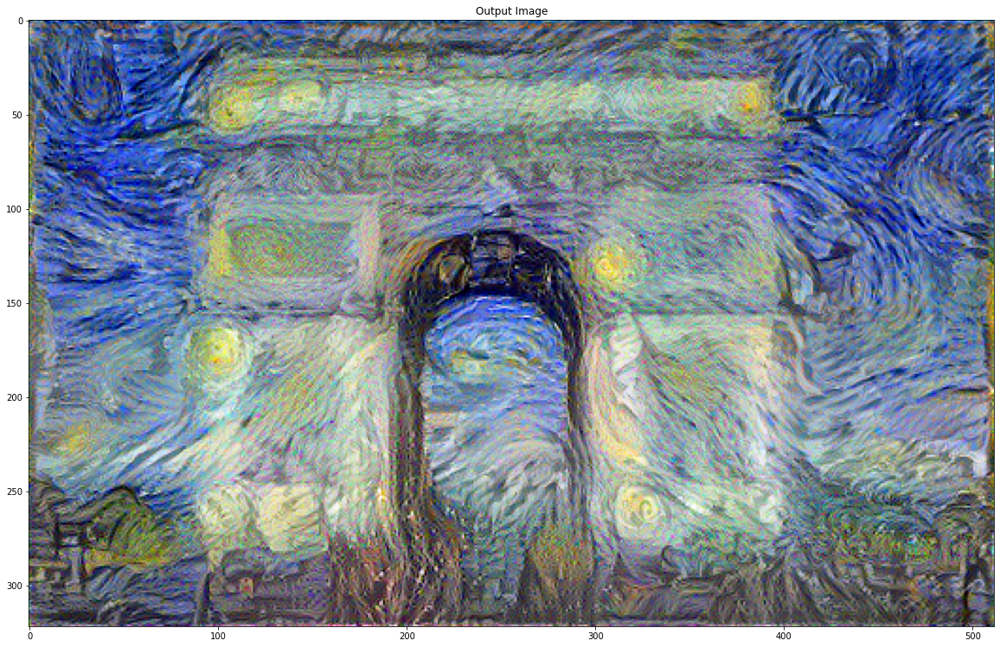

In [7]:
# show Arc de Triomphe with Starry Nigh of Van Gogh.
g_content_url = g_img_url_list[1]
g_style_url = g_img_url_list[3]
best_matched_img, least_loss = NeuralStyleTransfer(g_content_url, g_style_url, weight_ratio=1e-4, display=False, early_exit_cfg={'early_exit_num':15})
show_results(g_content_url, g_style_url, best_matched_img)

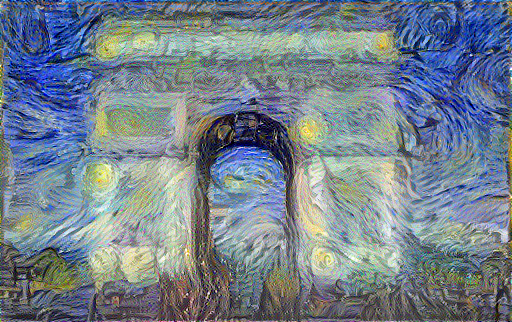

In [9]:
# show Arc de Triomphe with Starry Nigh of Van Gogh.
Image.fromarray(best_matched_img)

Total time: 8496.1592s


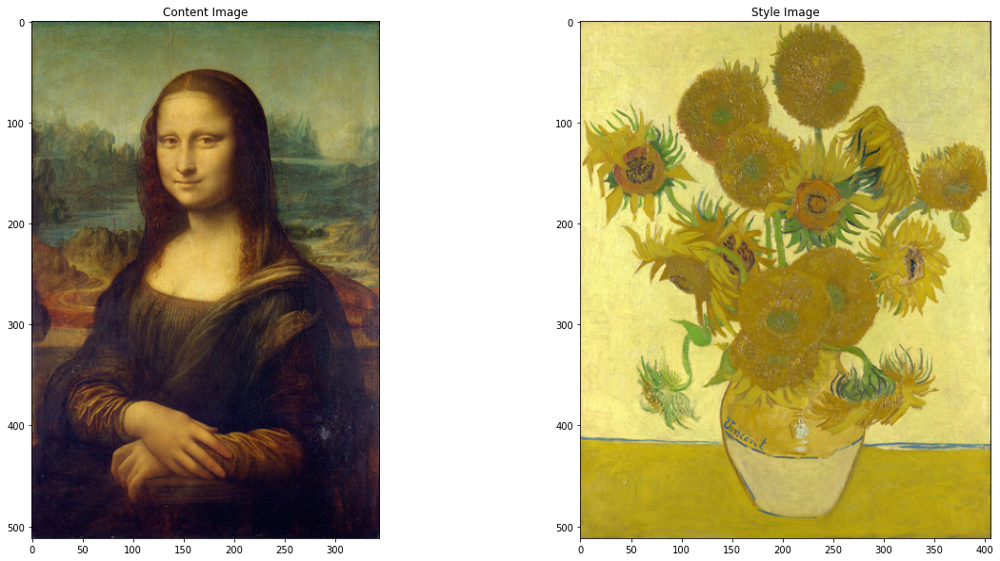

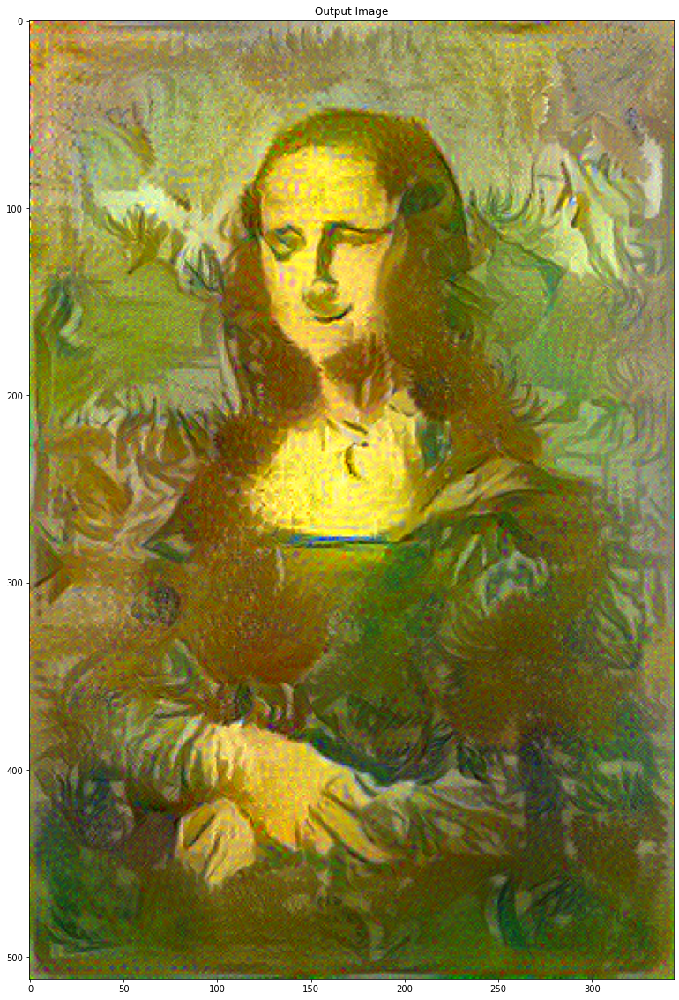

In [17]:
# show Mona lisa with Shipwreck of the Minotaur by William Turner.
g_content_url = g_img_url_list[2]
g_style_url = g_img_url_list[-1]
best_matched_img, least_loss = NeuralStyleTransfer(g_content_url, g_style_url, weight_ratio=1e-4, display=False, early_exit_cfg={'early_exit_num':15})
show_results(g_content_url, g_style_url, best_matched_img)

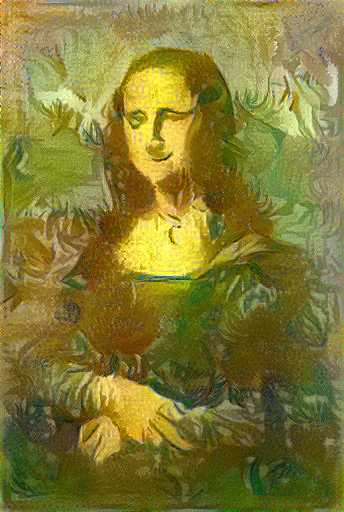

In [18]:
# show Mona lisa with Shipwreck of the Minotaur by William Turner.
Image.fromarray(best_matched_img)